In [11]:
import numpy as np
import pandas as pd
import chart_studio.plotly as py
import seaborn as sns
import cufflinks as cf
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

<Axes: >

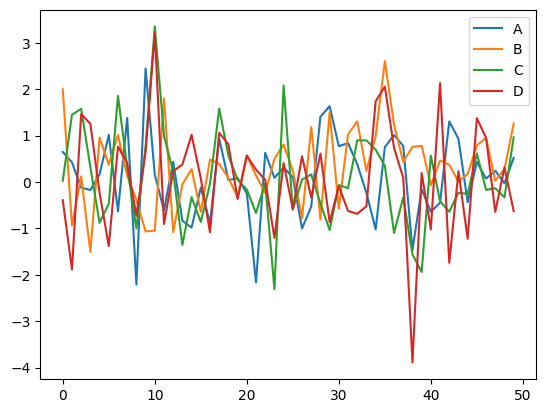

In [8]:
arr_1=np.random.randn(50,4)
df_1=pd.DataFrame(arr_1,columns=['A','B','C','D'])
df_1.head()
df_1.plot() 

In [9]:
#the same plot can be better accessed by using iplot command
df_1.iplot()

LINE PLOTS

In [12]:
import plotly.graph_objects as go
stocks=px.data.stocks() #inbuilt data package in plotly
stocks.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [16]:
#plotting the line plot 
px.line(data_frame=stocks,x='date',y='GOOG',labels={'x':'Date','y':'Price'})

In [18]:
#To see multiple charts on the same plot
px.line(data_frame=stocks,x='date',y=['GOOG','AAPL'],labels={'x':'Date','y':'Price'},title='Apple vs Google')

In [21]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=stocks.date,y=stocks.AAPL,mode='lines',name='Apple'))
fig.add_trace(go.Scatter(x=stocks.date,y=stocks.AMZN,mode='lines+markers',name='Amazon'))
fig.add_trace(go.Scatter(x=stocks.date,y=stocks.GOOG,mode='lines+markers',name='Google',line=dict(color='firebrick',width=2,dash='dashdot')))

In [22]:
#we can also update changes in a figure after it is once plotted
fig.update_layout(title='Stock Price Data 2018-2020',xaxis_title='Date',yaxis_title='Price')

In [24]:
#some more updates
fig.update_layout(xaxis=dict(showline=True,showgrid=True,showticklabels=True,linecolor='rgb(204,204,204)',
                             linewidth=2,ticks='outside',tickfont=dict(family='Arial',size=12,color='rgb(82,82,82)')),
                  yaxis=dict(showline=False,showgrid=False,showticklabels=False,zeroline=True,linecolor='rgb(204,204,204)',
                             linewidth=4,ticks='inside'),autosize=False,margin=dict(autoexpand=False,l=100,r=20,t=120),
                  showlegend=False,plot_bgcolor='white')

BAR CHARTS

In [25]:
us=px.data.gapminder().query("country=='United States'")
px.bar(data_frame=us,x='year',y='pop')

In [26]:
#grouping the data on some category
tips=px.data.tips()
px.bar(data_frame=tips,x='day',y='tip',color='sex',title='Tips by Sex on Each Day',labels={'tip':'Tip Amount','day':'Day of the Week'})

In [27]:
#To group them and plot them side by side on different bars
px.bar(data_frame=tips,x='sex',y='total_bill',color='smoker',barmode='group')

In [30]:
europe=px.data.gapminder().query('continent=="Europe" and year==2007 and pop>2.e6') #taking the data satisfying the given conditions
fig=px.bar(data_frame=europe,x='country',y='pop',text='pop',color='country')
fig

In [35]:
#let say we want the population to be written above the bars
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=10,xaxis_tickangle=90) #increasing the text size and changing the angle of text to make it vertical in the x axis
fig 

SCATTER PLOT

In [36]:
iris=px.data.iris()
px.scatter(data_frame=iris,x='sepal_width',y='sepal_length',color='species',size='petal_length',hover_data=['petal_width'])

In [38]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=iris.sepal_width,y=iris.sepal_length,mode='markers',
                         marker_color=iris.sepal_width,text=iris.species,
                         marker=dict(showscale=True),marker_line_width=2,marker_size=10))

In [42]:
fig=go.Figure(data=go.Scattergl(x=np.random.randn(100000),
                                y=np.random.randn(100000),
                                mode='markers',
                                marker=dict(color=np.random.randn(100000),
                                            colorscale='Viridis',
                                            line_width=1)))
fig

PIE CHARTS

In [44]:
asia=px.data.gapminder().query("year==2007").query("continent=='Asia'")
px.pie(asia,values='pop',names='country',title='Population of Asian Continent',color_discrete_sequence=px.colors.sequential.RdBu)

In [50]:
colors=['blue','green','black','purple','red','brown']
fig=go.Figure(data=go.Pie(labels=['Water','Grass','Normal','Psychic','Fire','Ground'],values=[110,90,80,80,70,60]))
fig.update_traces(hoverinfo='label+percent',textfont_size=20,textinfo='label+percent',pull=[0.1,0,0.2,0,0,0],
                  marker=dict(colors=colors,line=dict(color='#FFFFFF',width=2)))
fig

HISTOGRAMS

In [51]:
dice1=np.random.randint(1,7,5000)
dice2=np.random.randint(1,7,5000)
dice_sum=dice1+dice2
fig=px.histogram(dice_sum,nbins=11,labels={'value':'Dice Roll'},title='5000 Dice Roll Histogram',marginal='violin',
                 color_discrete_sequence=['green'])
fig

In [53]:
fig.update_layout(xaxis_title_text='Dice Sum',
                  yaxis_title_text='Dice Roll',
                  bargap=0.2, showlegend=False)


In [54]:
#stacking histograms
tips=px.data.tips()
px.histogram(tips,x='total_bill',color='sex')

BOX PLOT

In [73]:
tips=px.data.tips()
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [74]:
px.box(tips,x='sex',y='tip',points='all')

In [57]:
px.box(tips,x='day',y='tip',color='sex')

In [59]:
fig=go.Figure()
fig.add_trace(go.Box(x=tips.sex,y=tips.tip,
                     marker_color='blue',
                     boxmean='sd')) #plots standard deviation on the box plot instead of mean

In [69]:
stocks=px.data.stocks()
stocks.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [70]:
fig=go.Figure()
fig.add_trace(go.Box(y=stocks.GOOG,boxpoints='all',fillcolor='blue',jitter=0.5, whiskerwidth=0.2))
fig.add_trace(go.Box(y=stocks.AAPL,boxpoints='all',fillcolor='red',jitter=0.5, whiskerwidth=0.2))
fig.update_layout(title='Google vs Apple',yaxis=dict(gridcolor='rgb(255,255,255)',gridwidth=3),
                  paper_bgcolor='rgb(243,243,243)',plot_bgcolor='rgb(243,243,243)')
fig

VIOLIN PLOT

In [71]:
tips=px.data.tips()
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [72]:
px.violin(tips,y='total_bill',box=True,points='all')

In [62]:
px.violin(tips,y='tip',x='smoker',color='sex',box=True,points='all',hover_data=tips.columns )

In [65]:
#To morph the left and right sides of the violin plot to represent different data
fig=go.Figure()
fig.add_trace(go.Violin(x=tips['day'][tips.smoker=='Yes'],
                        y=tips['total_bill'][tips.smoker=='Yes'],
                        legendgroup='Yes',scalegroup='Yes',name='Yes',
                        side='negative',line_color='Blue'))
fig.add_trace(go.Violin(x=tips['day'][tips.smoker=='No'],
                        y=tips['total_bill'][tips.smoker=='No'],
                        legendgroup='Yes',scalegroup='Yes',name='No',
                        side='positive',line_color='Red'))

DENSITY HEATMAPS

In [66]:
flights=sns.load_dataset('flights')
flights.head()

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121


In [68]:
fig=px.density_heatmap(flights,x='year',y='month',z='passengers',color_continuous_scale='Viridis')
fig

3D SCATTER PLOT

In [77]:
fig=px.scatter_3d(flights,x='year',y='month',z='passengers',color='year',opacity=0.5)
fig

3D LINE PLOT

In [81]:
fig=px.line_3d(flights,x='year',y='month',z='passengers',color='year')
fig